# 0. Load parameters


In [1]:
# | tags: [parameters]
subject = "103"

In [16]:
# | tags: [parameters]
# Injected Parameters
subject = 101

In [17]:
from datetime import datetime
from pathlib import Path
import toml


def print_date_time():
    now = datetime.now()
    # Convert the date and time to a string
    now_str = now.strftime("%Y-%m-%d %H:%M:%S")

    # Print the date and time
    print(now_str)


def read_config():
    paths = [".env.toml", "../.env.toml", "../../.env.toml"]
    for path in paths:
        file_path = Path(path)
        if file_path.exists():
            print(f"Reading configuration from {file_path}")
            config = toml.load(file_path)
            return config


print_date_time()

2024-03-21 02:23:25


In [18]:
import mne
import autoreject
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from mne.preprocessing import ICA
import toml
import mne_bids
import re
from pathlib import Path
import matplotlib
import numpy as np
from ipywidgets import interact
from mne.preprocessing import ICA

from eeglabio.utils import export_mne_raw

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")


config = read_config()
project_path = config["project"]["path"]

epochs_path = f"{
    project_path}/data/preproc/sub-{subject}/epochs/"
preproc_path = f"{
    project_path}/data/preproc/sub-{subject}/raw/"
path_specparam = f"{
    project_path}/data/preproc/sub-{subject}/"
figure_path = f"{project_path}/analysis/sub-{subject}/figures"


Path(preproc_path).mkdir(parents=True, exist_ok=True)
Path(figure_path).mkdir(parents=True, exist_ok=True)

Reading configuration from ../../.env.toml


This file contains preprocessing files after downsampling them.


# 2. Work with epochs


In [19]:
# non-filterd epochs ICAs
from mne_icalabel import label_components
from autoreject import get_rejection_threshold  # noqa


def plot_epochs(epochs, stage="epochs", n_epochs=10, n_channels=10, fmax=100.0):
    # plot the data
    epochs_plot = epochs.copy().average().detrend().plot_joint()
    epochs_plot.savefig(
        f"{figure_path}/sub-{subject}_{stage}.png", dpi=300, bbox_inches="tight"
    )
    mne.viz.plot_epochs(
        epochs=epochs,
        picks="eeg",
        show=False,
        n_epochs=n_epochs,
        n_channels=n_channels,
        scalings=dict(eeg=1e-4),
        show_scrollbars=False,
    )
    epochs_plot_psd = epochs.compute_psd(
        method="welch", picks="eeg", fmax=100.0, exclude="bads"
    ).plot(average=True, picks="eeg", exclude="bads", show=False)
    epochs_plot_psd.savefig(
        f"{figure_path}/sub-{subject}_{stage}_psd.png", dpi=300, bbox_inches="tight"
    )

In [26]:
def compute_ica(
    eeg_data,
    reject_log=None,
    n_components=0.999,
    method="picard",
    random_state=99,
):
    """Compute ICA on the data without really bad epochs"""
    ica = ICA(
        n_components=n_components,
        random_state=random_state,
        method="picard",
        fit_params=dict(ortho=False, extended=True),
    )
    ica.fit(eeg_data)

    return ica


def label_components_ica(eeg_data, ica):
    """Assign the IC labels"""

    ic_labels = label_components(eeg_data, ica, method="iclabel")
    labels = ic_labels["labels"]
    return labels, ic_labels


def get_values(labels, ic_labels, threshold=0.8):
    """Get the indices of the labels"""
    element_indices = {}
    element_indices["bad_prob_class"] = []
    prababilities = ic_labels["y_pred_proba"]

    for i, element in enumerate(labels):
        if prababilities[i] > 0.8:
            if element not in element_indices:
                element_indices[element] = []
            element_indices[element].append(i)
        else:
            element_indices["bad_prob_class"].append(i)

    # display(element_indices)
    return element_indices


def plot_ica_components(ica, eeg_data, plot_properties=[]):
    """Plot the ICA components"""

    label_components_ica(eeg_data, ica)
    labeled_components = get_values(labels, ic_labels)

    for label, indices in labeled_components.items():
        # display(label, indices)
        # ica_plot = ica.plot_sources(
        #    eeg_data, show_scrollbars=False, picks=slice(0, 20))
        print(label, indices)
        ica_plot = ica.plot_components(picks=indices)

        chunk_size = 20
        chunks = [
            indices[i: i + chunk_size] for i in range(0, len(indices), chunk_size)
        ]
        for chunk in chunks:
            ica_plot = ica.plot_sources(
                eeg_data,
                show_scrollbars=False,
                picks=chunk,
                start=0,
                stop=len(epochs) - 1,
            )

        if plot_properties:
            ica.plot_properties(eeg_data, picks=indices,
                                psd_args={"fmax": 100.0})
    return labeled_components


def plot_removed_components(
    ica,
    eeg_data,
    labeled_components,
    chosen_components=[
        "eye blink",
        "heart beat",
        "line noise",
        "muscle artifact",
        "channel noise",
    ],
):
    exclude = []
    for label, indices in labeled_components.items():
        if label in chosen_components:
            ica_plot = ica.plot_sources(
                eeg_data, show_scrollbars=False, picks=indices)
            display(label, indices)
            figs = ica.plot_properties(
                epochs, picks=indices, psd_args={"fmax": 100.0})

            for fig, ind in zip(figs, indices):
                # fig = ica.plot_properties(eeg_data, picks=ind)
                fig.savefig(
                    f"{figure_path}/sub-{subject}_ICA{str(ind).zfill(3)}_{
                        label.replace(" ", "-")}.png",
                    dpi=300,
                    bbox_inches="tight",
                )
            exclude = exclude + indices
    return exclude

In [21]:
epochs = mne.read_epochs(f"{epochs_path}/sub-{subject}_drop_bad-epo.fif", preload=True)
ica = compute_ica(epochs, n_components=0.99, method="picard")
labels, ic_labels = label_components_ica(epochs, ica)

Reading /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101/epochs/sub-101_drop_bad-epo.fif ...


    Found the data of interest:
        t =       0.00 ...    5000.00 ms
        0 CTF compensation matrices available
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Fitting ICA to data using 243 channels (please be patient, this may take a while)
Selecting by explained variance: 47 components
Fitting ICA took 14.6s.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_68725/2822097664.py:23: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_68725/3023804207.py:23: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
bad_prob_class [0, 1, 3, 9, 10, 11, 12, 13, 15, 16, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 35, 36, 37, 39, 40, 43, 44, 45]


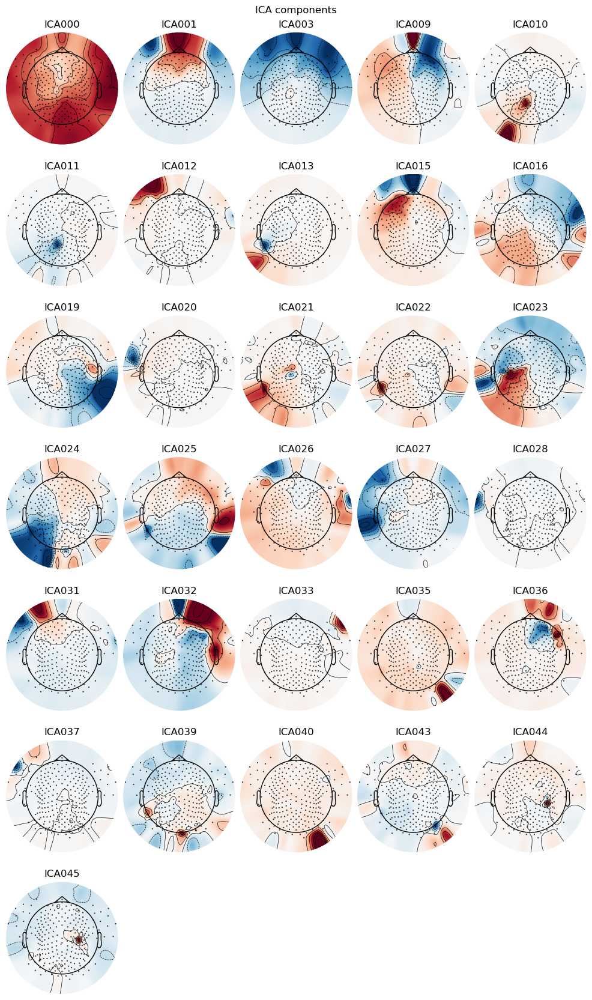

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


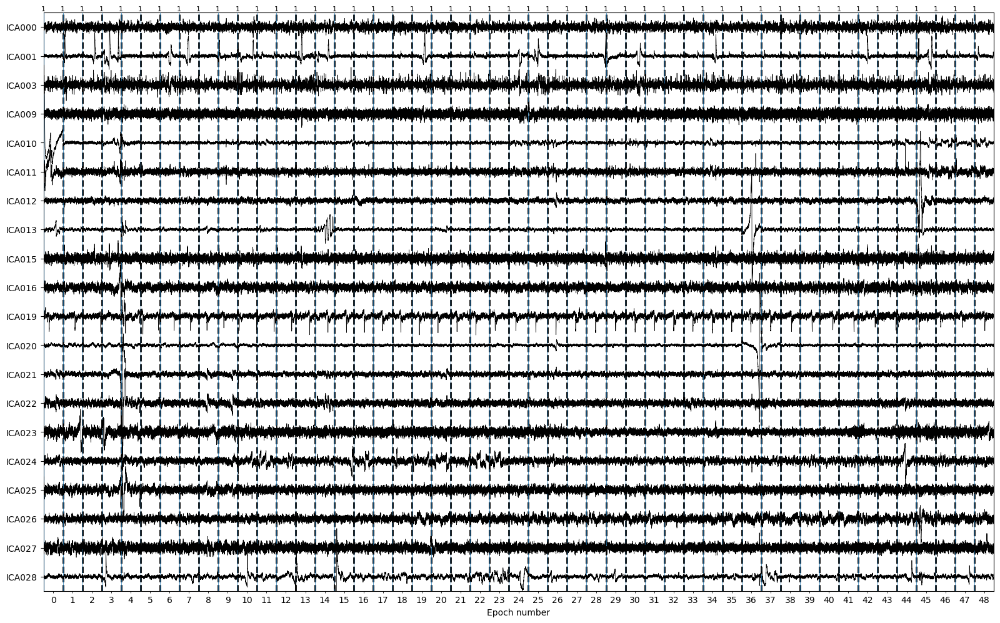

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


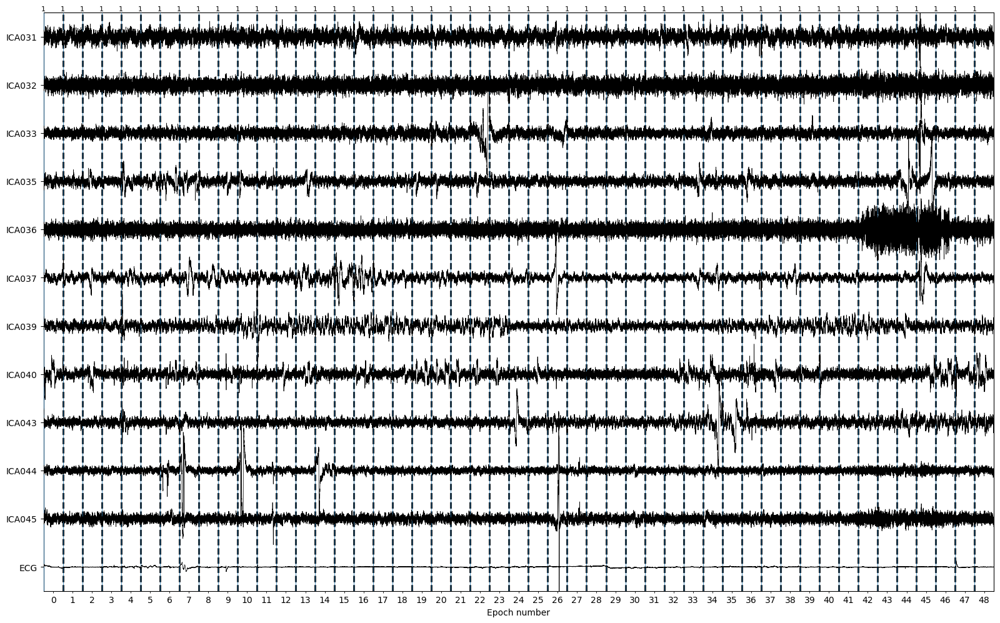

brain [2, 5, 6, 7, 14, 17]


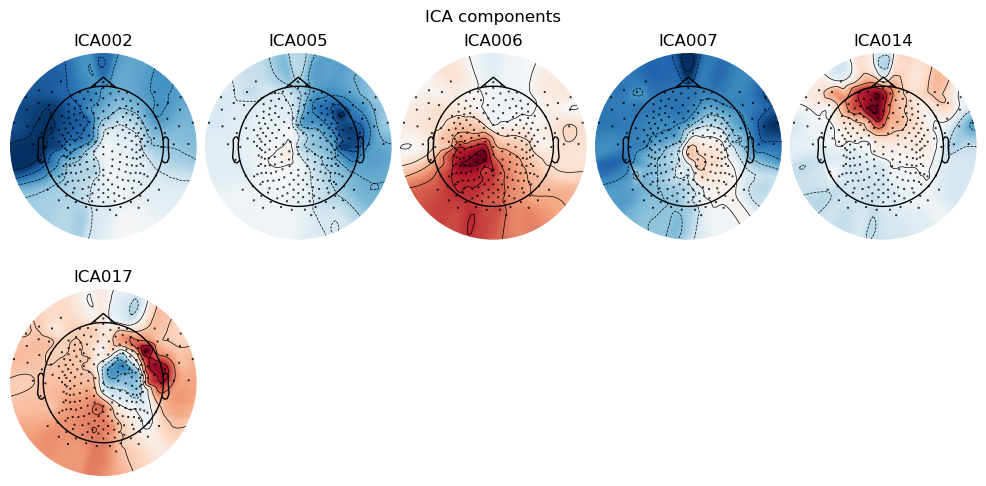

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


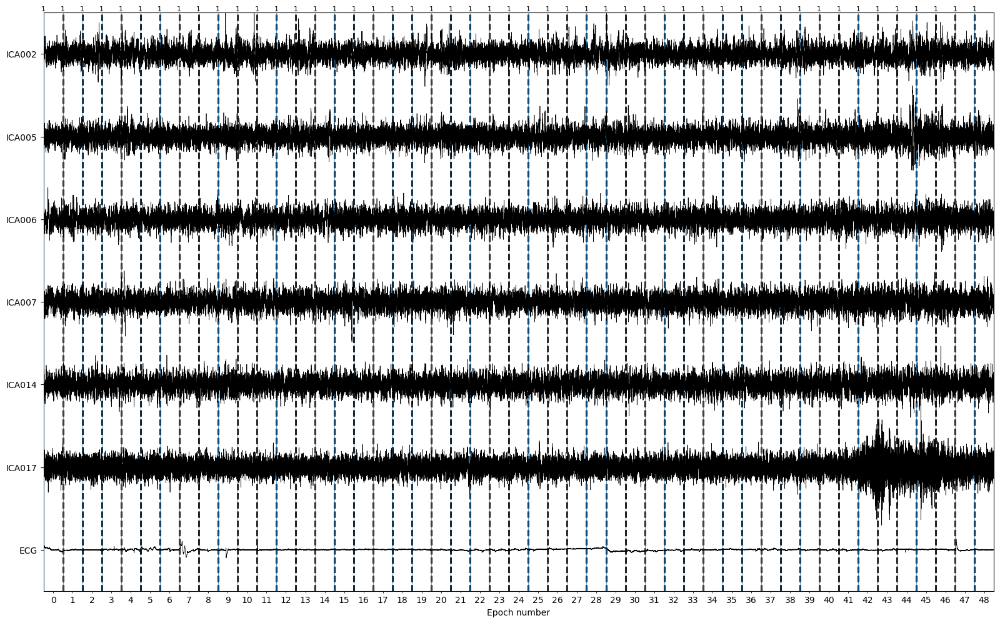

eye blink [4]


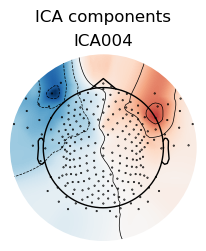

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


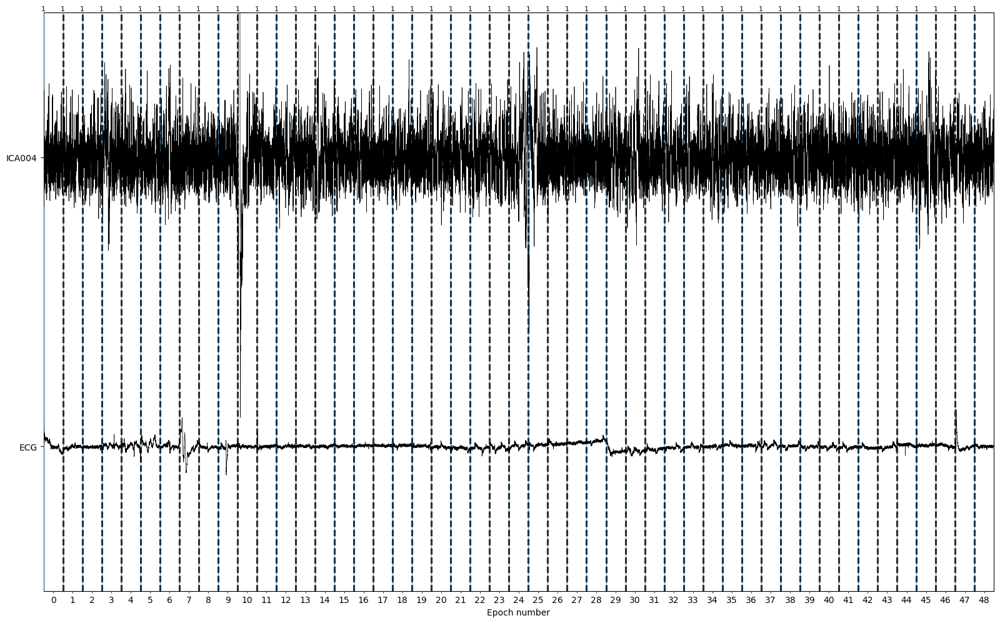

heart beat [8]


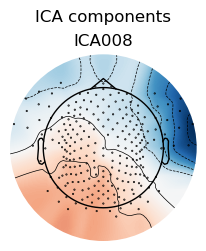

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


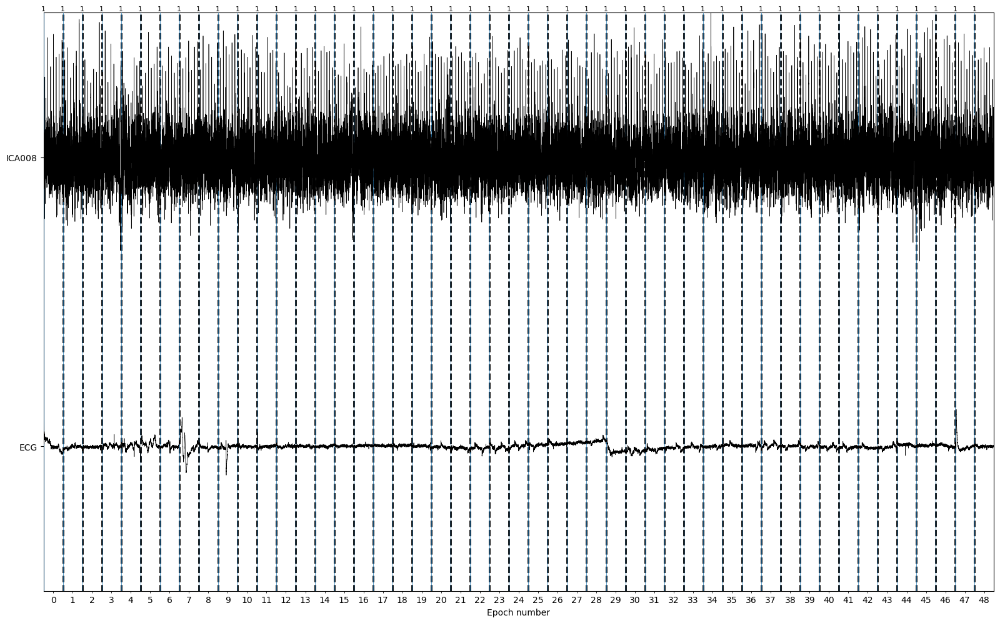

muscle artifact [18, 30, 34, 38, 41]


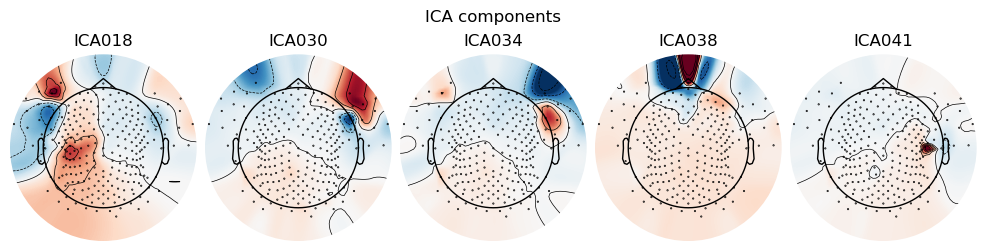

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


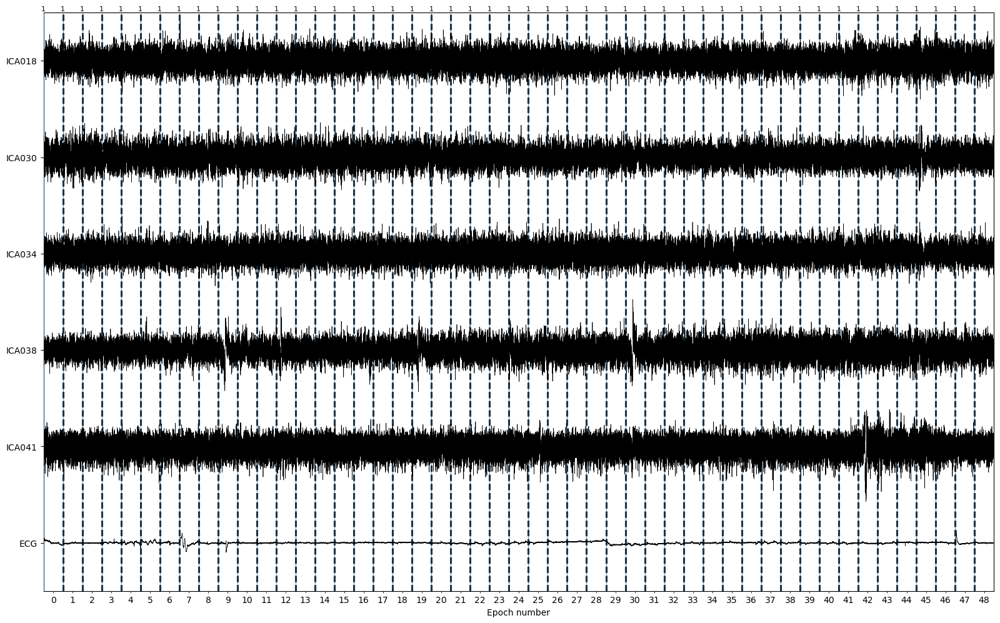

channel noise [29, 42, 46]


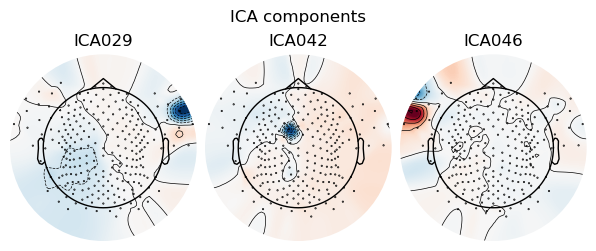

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


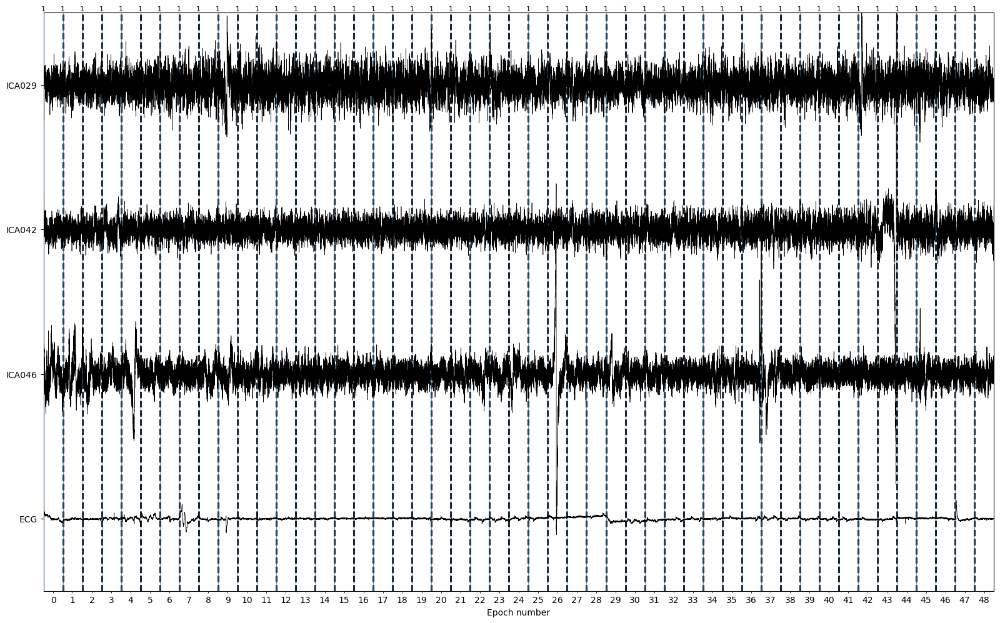

In [27]:
labeled_components = plot_ica_components(ica, epochs, plot_properties=False)

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


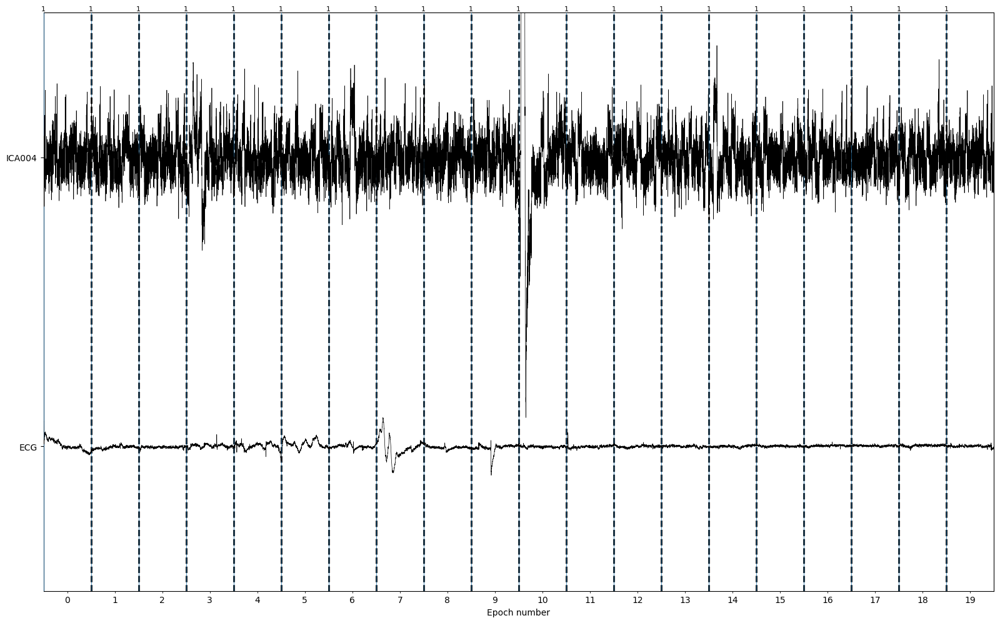

'eye blink'

[4]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


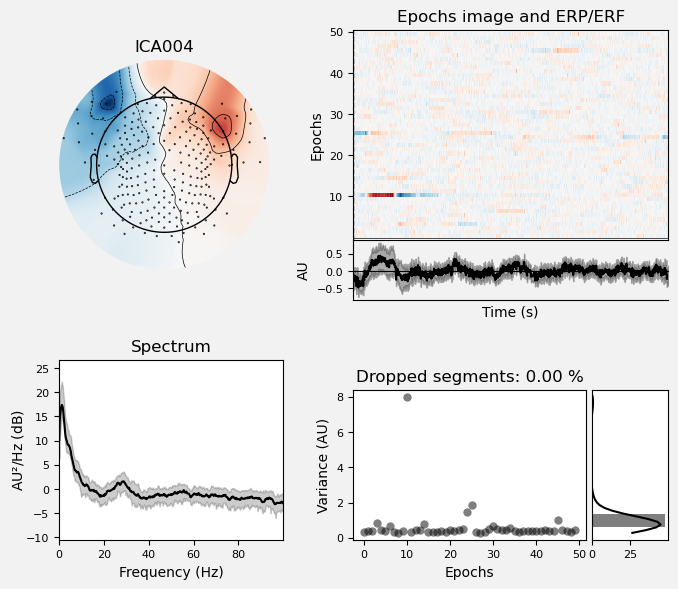

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


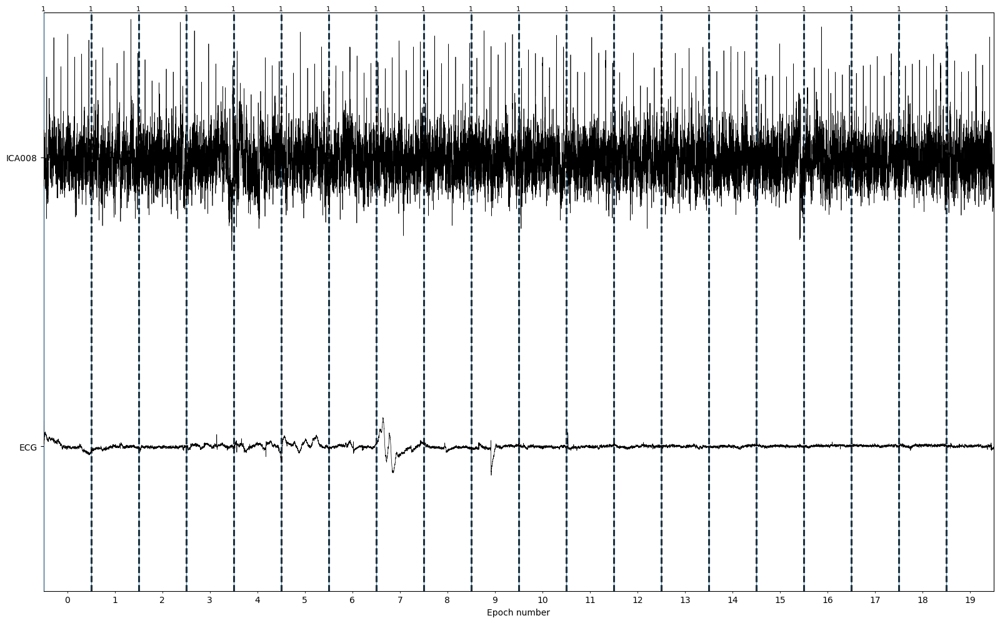

'heart beat'

[8]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


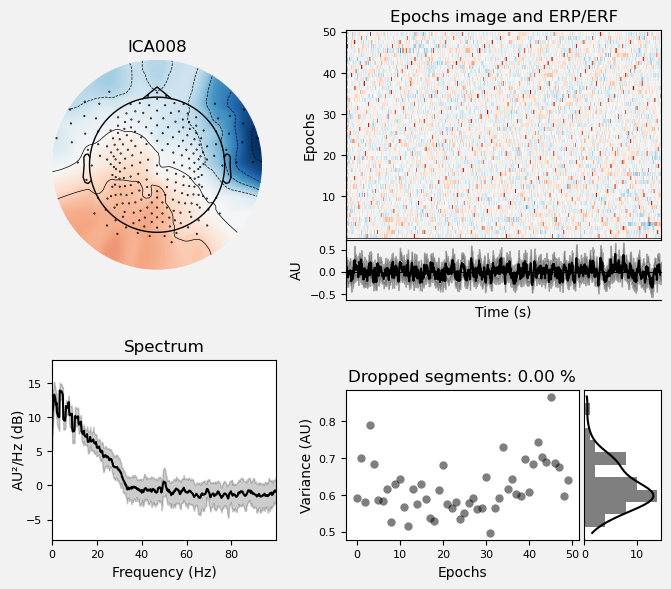

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


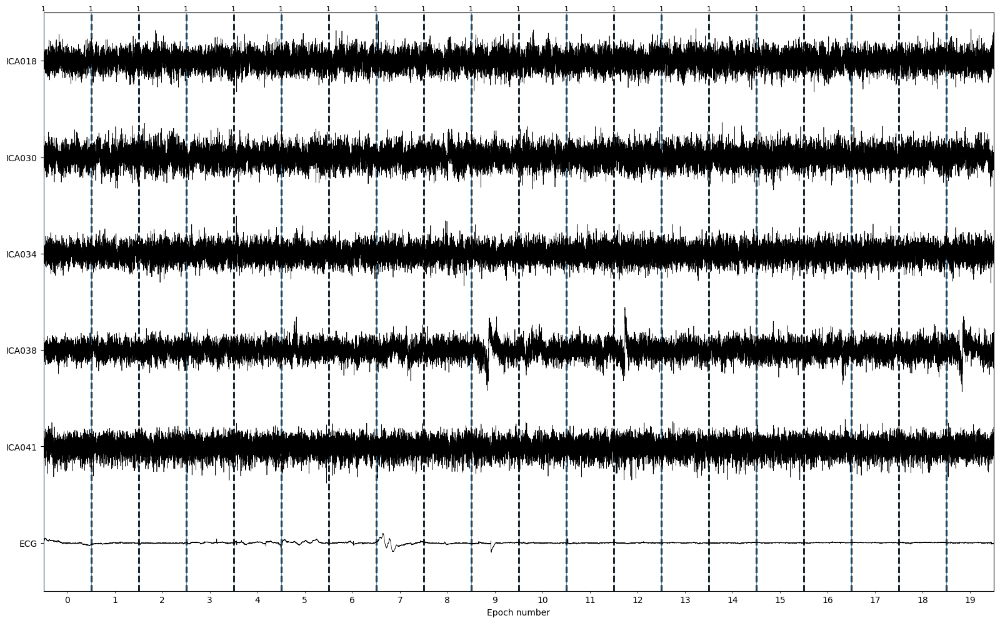

'muscle artifact'

[18, 30, 34, 38, 41]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


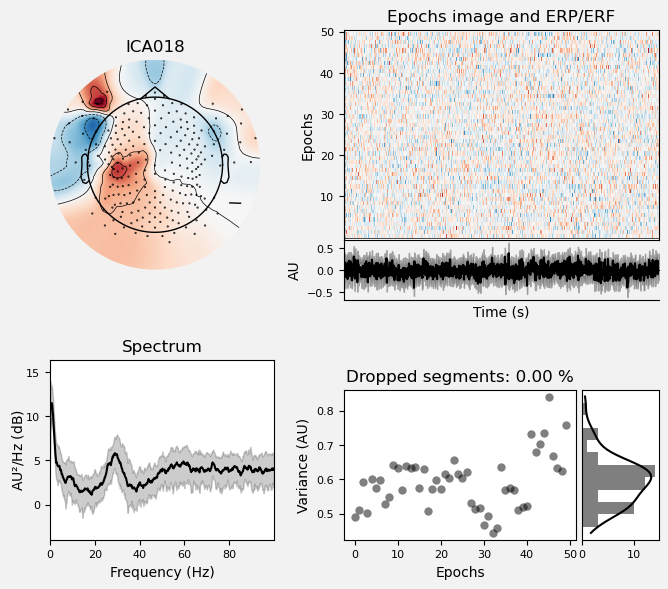

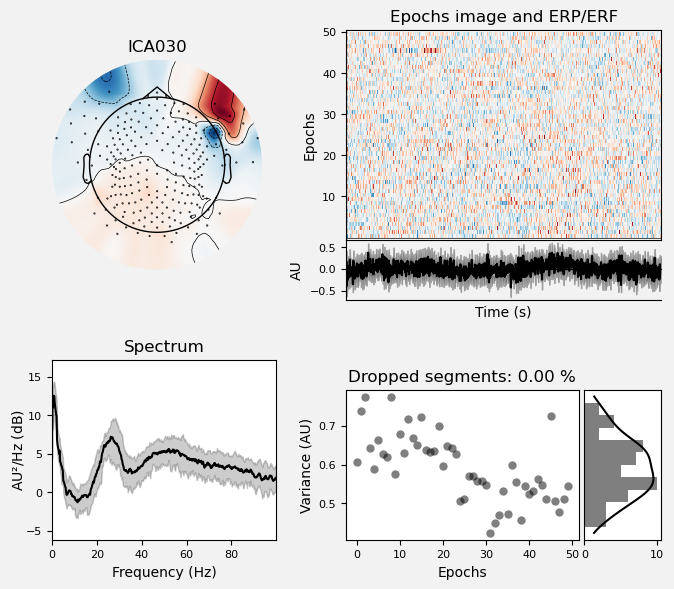

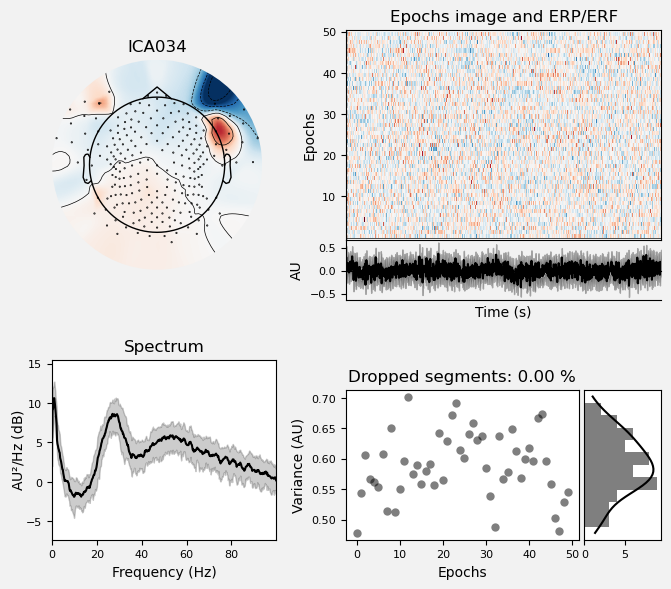

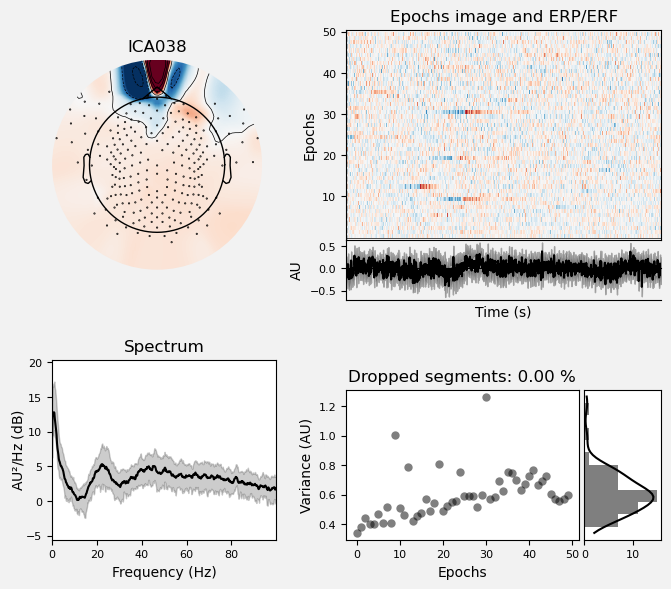

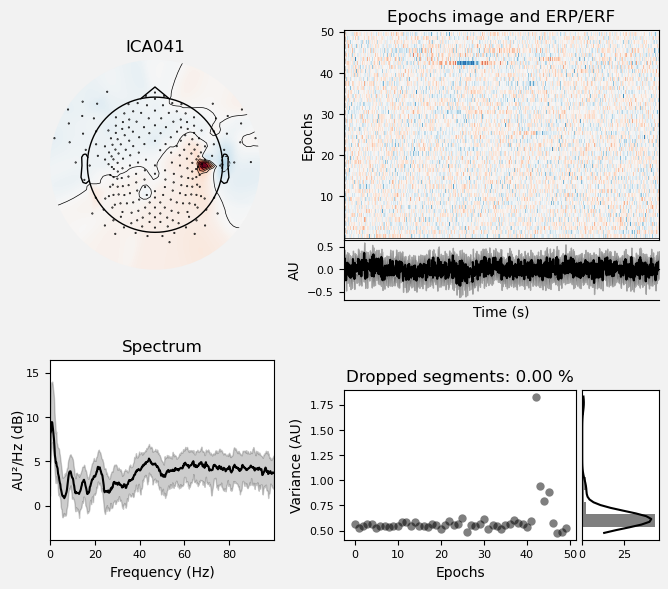

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


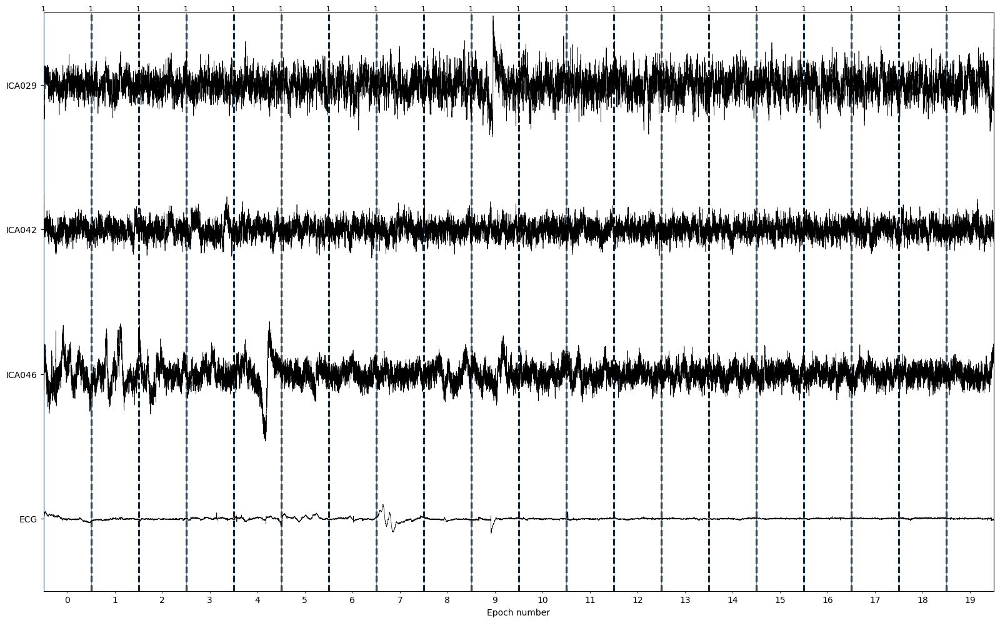

'channel noise'

[29, 42, 46]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


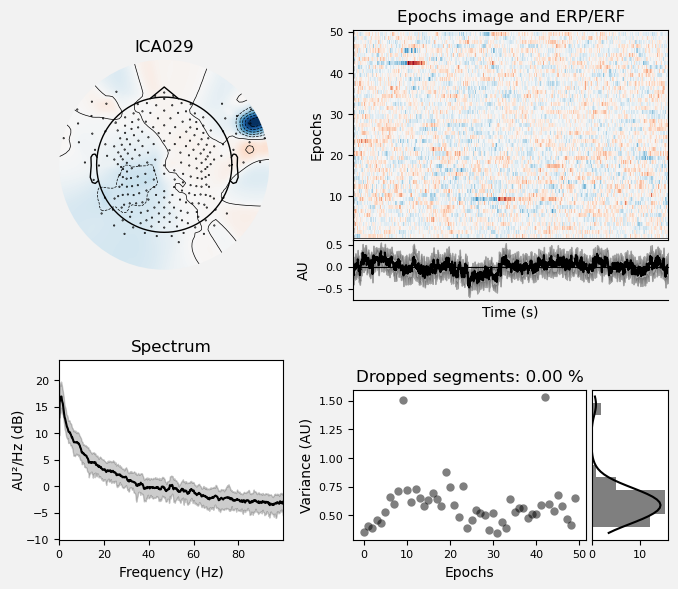

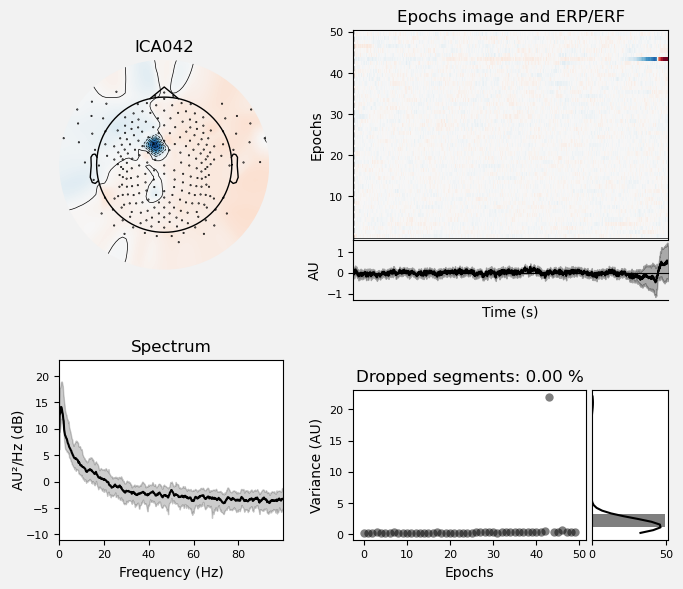

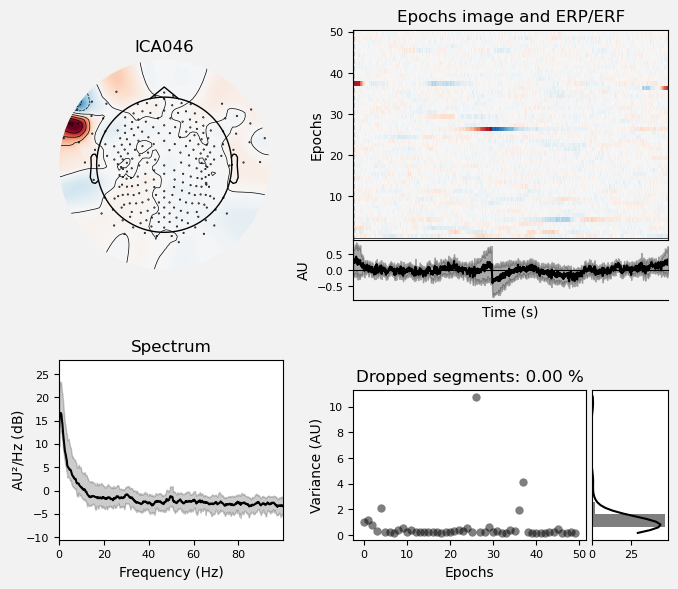

In [28]:
chosen_components = [
    "eye blink",
    "heart beat",
    "line noise",
    "muscle artifact",
    "channel noise",
]
exclude = plot_removed_components(
    ica, epochs, labeled_components, chosen_components=chosen_components
)

Opening raw data file /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101/raw//sub-101_filtered_zap_eeg.fif...
    Range : 0 ... 147499 =      0.000 ...   294.998 secs
Ready.
Reading 0 ... 147499  =      0.000 ...   294.998 secs...
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann wi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


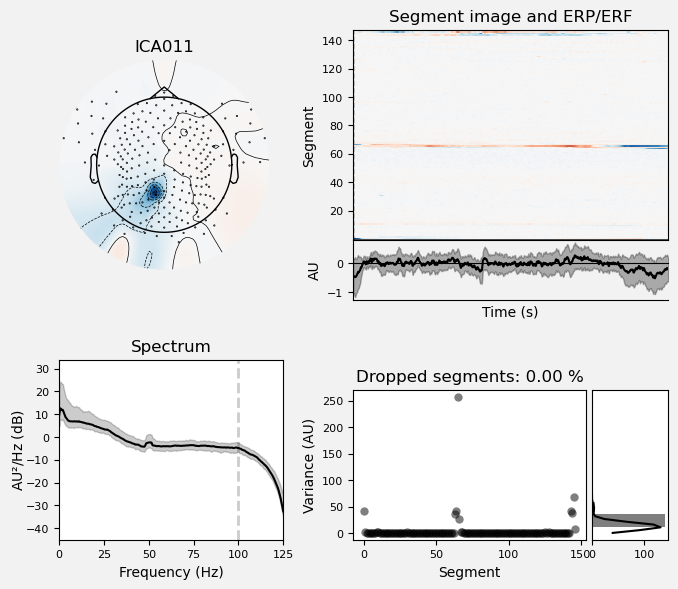

Creating RawArray with float64 data, n_channels=2, n_times=147500
    Range : 0 ... 147499 =      0.000 ...   294.998 secs
Ready.


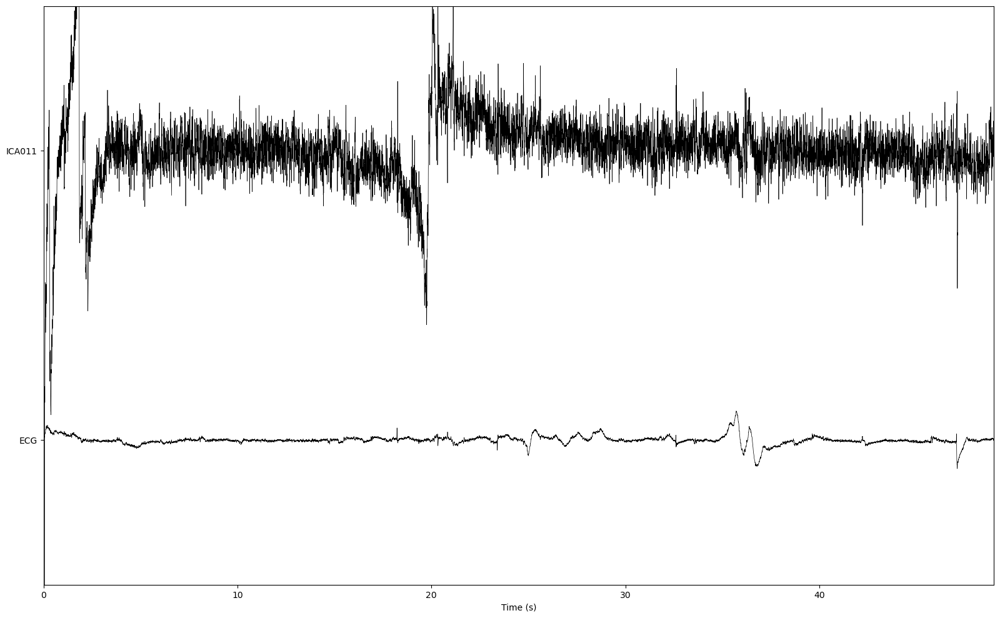

In [30]:
# ica_plot = ica.plot_sources(eeg_data)
# Exclude blink artifact components (use Fp1 as EOG proxy)
clean_raw = mne.io.read_raw_fif(
    f"{preproc_path}/sub-{subject}_filtered_zap_eeg.fif", preload=True
)
# epochs_eog = mne.preprocessing.create_eog_epochs(raw=clean_raw, ch_name="EOG")
# eog_indices, eog_scores = ica.find_bads_eog(epochs_eog, ch_name="E31", threshold=2)
ecg_indices, ecg_scores = ica.find_bads_ecg(
    clean_raw, method="correlation", threshold="auto"
)

# ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()

# barplot of ICA component "EOG match" scores
ica.plot_properties(clean_raw, picks=ecg_indices)

# plot ICs applied to raw data, with ECG matches highlighted
ecg_plot = ica.plot_sources(
    clean_raw,
    show_scrollbars=False,
    picks=ecg_indices,
    start=0,
    stop=len(epochs) - 1,
)

In [ ]:
# Automated exclusion of ICA components

Applying ICA to Epochs instance
    Transforming to ICA space (47 components)
    Zeroing out 11 ICA components
    Projecting back using 243 PCA components
Overwriting existing file.
Overwriting existing file.
No projector specified for this dataset. Please consider the method self.add_proj.


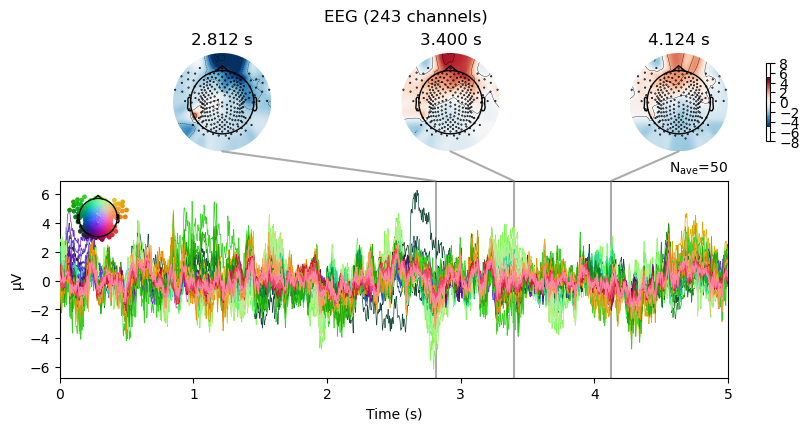

Effective window size : 4.096 (s)
Averaging across epochs...


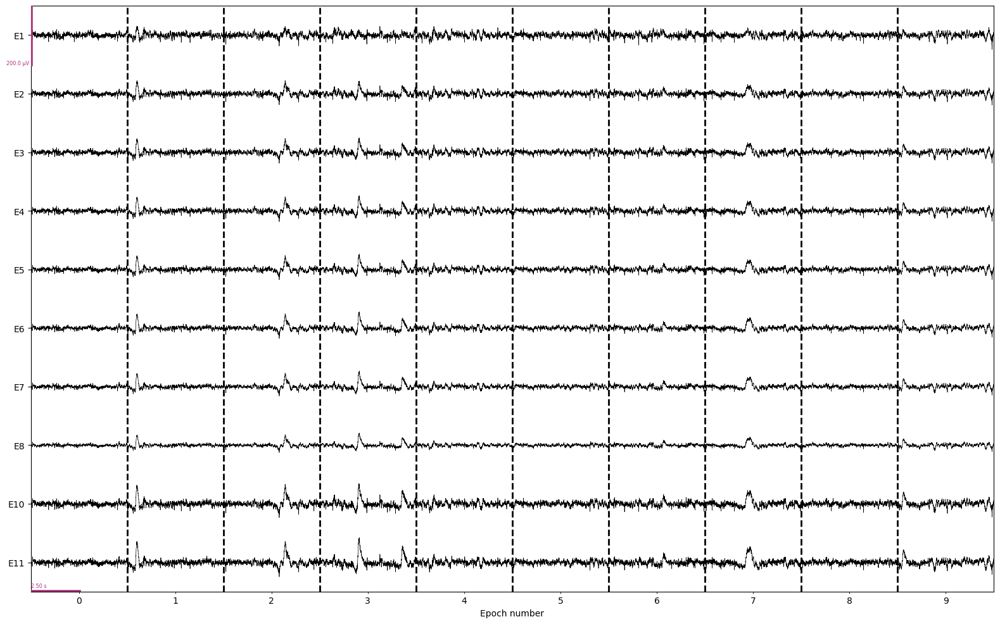

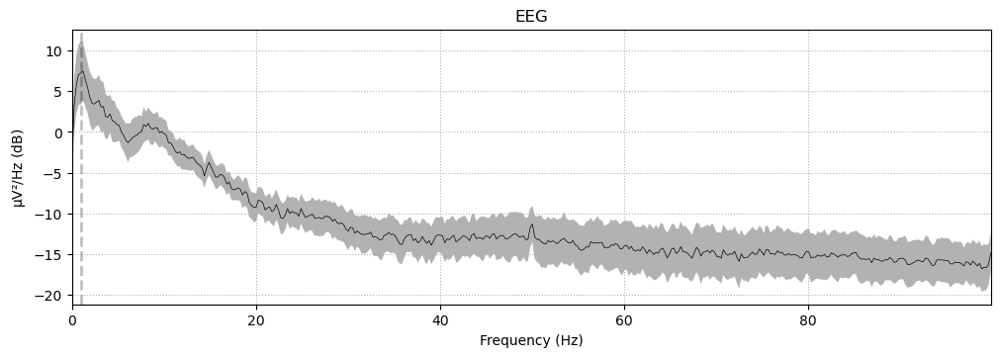

In [31]:
ica.exclude = exclude + ecg_indices
epochs_clean = ica.apply(epochs.copy(), exclude=ica.exclude)
epochs_clean.save(
    f"{epochs_path}/sub-{subject}_clean_ica-epo_automated.fif", overwrite=True
)
epochs_clean_plot = plot_epochs(epochs_clean, stage="epochs_after_ICA")

# Manually exclude more components


Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


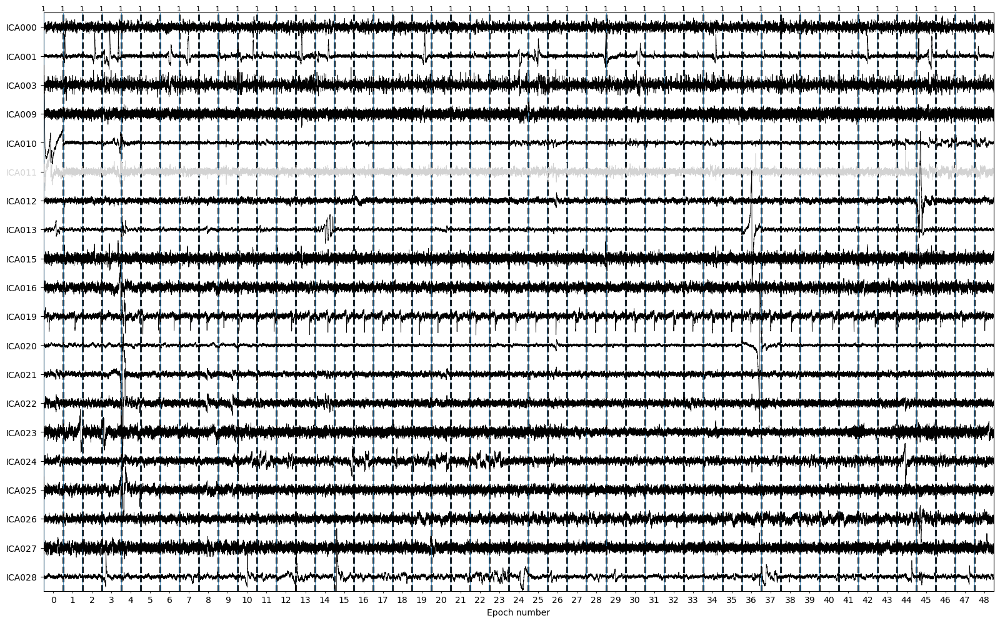

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


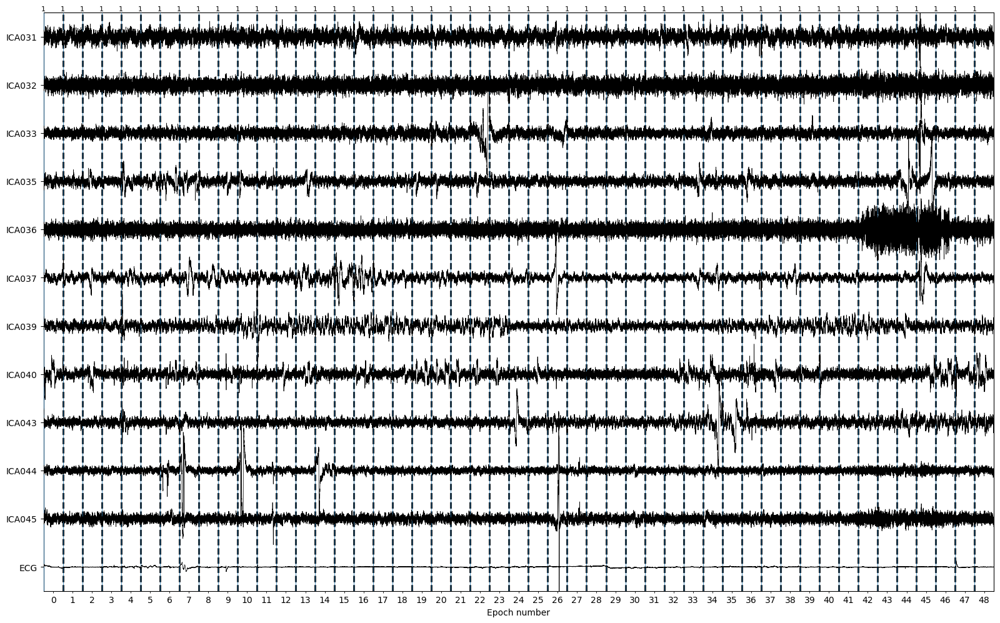

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated


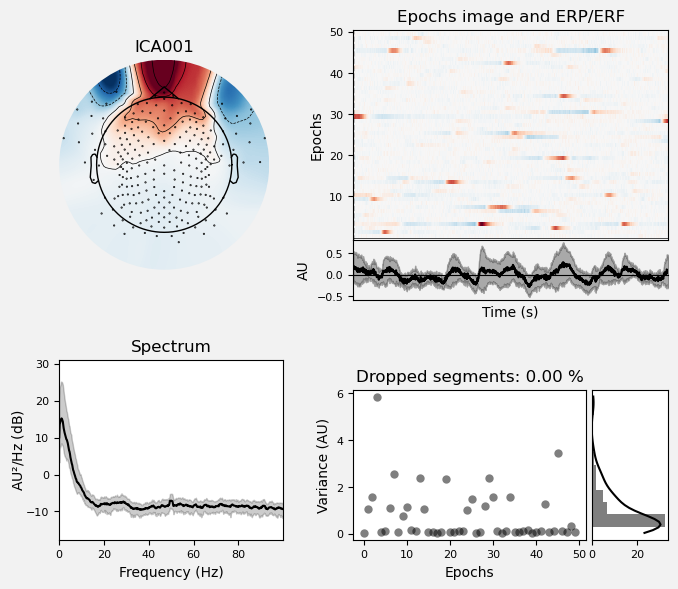

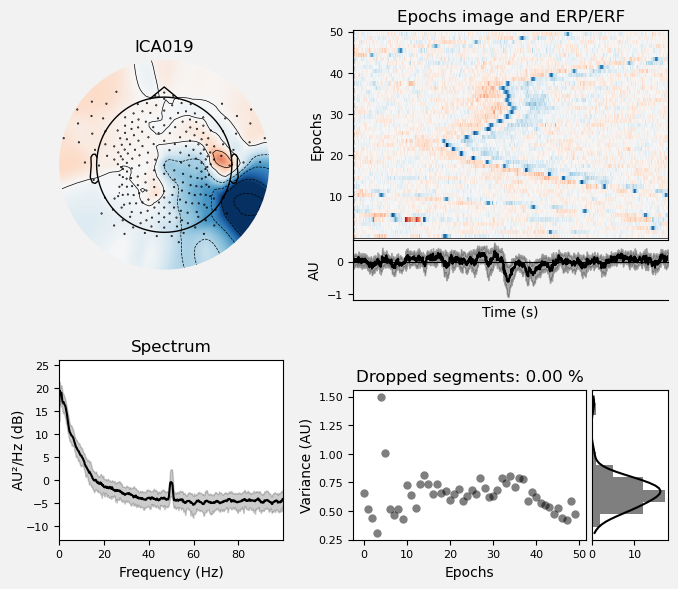

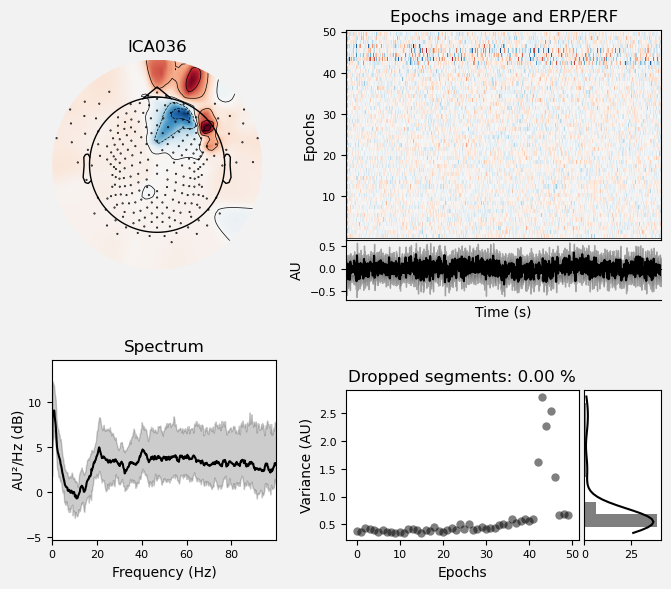

In [36]:
chunk_size = 20
indices = labeled_components["bad_prob_class"]
chunks = [indices[i: i + chunk_size]
          for i in range(0, len(indices), chunk_size)]
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs,
        show_scrollbars=False,
        picks=chunk,
        start=0,
        stop=len(epochs) - 1,
    )
manual_exclude = [1, 19, 36]
figs = ica.plot_properties(
    epochs, picks=manual_exclude, psd_args={"fmax": 100.0})

Applying ICA to Epochs instance
    Transforming to ICA space (47 components)
    Zeroing out 14 ICA components
    Projecting back using 243 PCA components
Overwriting existing file.
Overwriting existing file.


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_68725/3814702271.py:3: RuntimeWarning: This filename (/Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101/epochs//sub-101_clean_ica-manual.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs_clean_manual.save(


No projector specified for this dataset. Please consider the method self.add_proj.


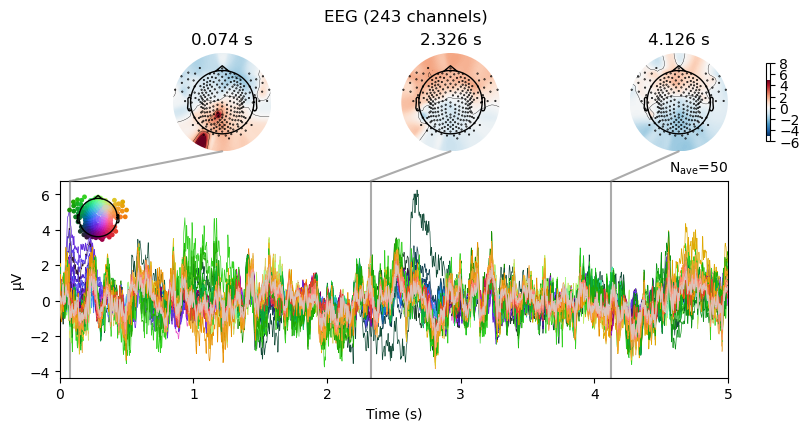

Effective window size : 4.096 (s)
Averaging across epochs...


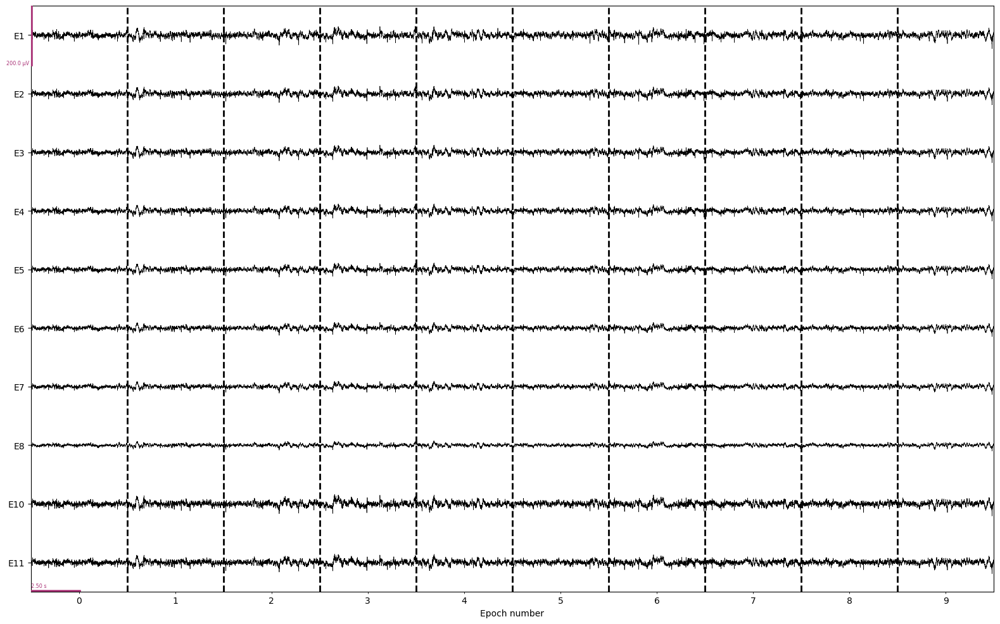

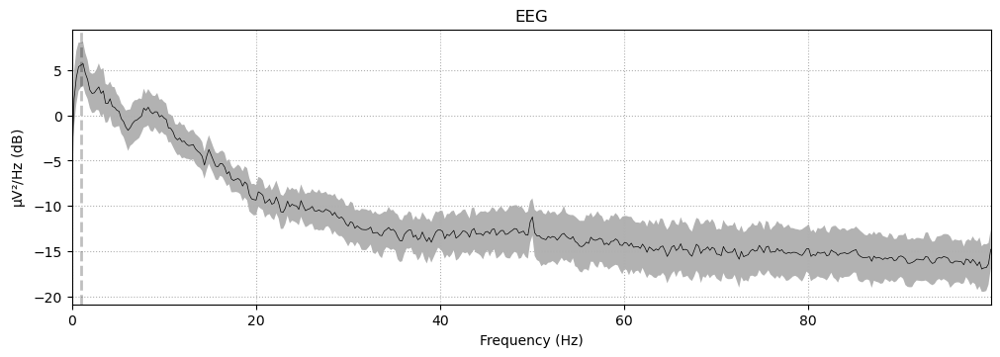

In [41]:
ica.exclude = exclude + ecg_indices + manual_exclude
epochs_clean_manual = ica.apply(epochs.copy(), exclude=ica.exclude)
epochs_clean_manual.save(
    f"{epochs_path}/sub-{subject}_clean_ica-manual.fif", overwrite=True
)
epochs_clean_plot = plot_epochs(epochs_clean, stage="epochs_after_ICA_manual")

In [40]:
print(f"There was {len(ica.exclude)} ICA components excluded: ", ica.exclude)

There was 14 ICA components excluded:  [4, 8, 18, 30, 34, 38, 41, 29, 42, 46, 11, 1, 19, 36]


In [12]:
# reject_log_plot = reject_log.plot_epochs(epochs[reject_log.bad_epochs], scalings=dict(eeg=1e-4))
# with mne.viz.use_browser_backend("qt"):
#    plot_bad_epochs = epochs[reject_log.bad_epochs].plot(
#        scalings=dict(eeg=1e-4))